## Introduction
[in-depth-analysis-visualisations-avito](https://www.kaggle.com/shivamb/in-depth-analysis-visualisations-avito)

In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

import plotly.offline as py
py.init_notebook_mode()
import plotly.graph_objs as go
import plotly.tools as tls

import warnings
warnings.filterwarnings("ignore")

In [3]:
train_df = pd.read_csv("~/.kaggle/competitions/avito-demand-prediction/train.csv", parse_dates=["activation_date"])
test_df = pd.read_csv("~/.kaggle/competitions/avito-demand-prediction/test.csv", parse_dates=["activation_date"])
pr_train = pd.read_csv("~/.kaggle/competitions/avito-demand-prediction/periods_train.csv", parse_dates=["activation_date", "date_from", "date_to"])

## Feature Engineering
ここでは以下のような特徴量を作成

1. WeekDay - 広告が掲載された曜日
2. Month - 広告が掲載された月
3. Month Day - 広告が掲載された日
4. Week of the year
5. Description_len - the description length
6. Title_len - the title length
7. Total Period - 広告が掲載されいていた期間
8. Deal Class - 取引のバイナリクラス
9. Param Combined (param1 + param2 + param3) - パラメータを連結した文字数の長さ

In [4]:
## 2. feature engineering 
# date time features
train_df['weekday'] = train_df.activation_date.dt.weekday
train_df['month'] = train_df.activation_date.dt.month
train_df['day'] = train_df.activation_date.dt.day
train_df['week'] = train_df.activation_date.dt.week 

# length of description
train_df['description'] = train_df['description'].fillna(" ")
train_df['description_len'] = train_df['description'].apply(lambda x : len(x.split()))

# length of title
train_df['title'] = train_df['title'].fillna(" ")
train_df['title_len'] = train_df['title'].apply(lambda x : len(x.split()))

# param_combined and its length
train_df['param_combined'] = train_df.apply(lambda row: ' '.join([str(row['param_1']), str(row['param_2']),  str(row['param_3'])]), axis=1)
train_df['param_combined'] = train_df['param_combined'].fillna(" ")
train_df['param_combined_len'] = train_df['param_combined'].apply(lambda x : len(x.split()))

# charater len of text columns
train_df['description_char'] = train_df['description'].apply(len)
train_df['title_char'] = train_df['title'].apply(len)
train_df['param_char'] = train_df['param_combined'].apply(len)

# total period for which ads were run 
pr_train['total_period'] = pr_train['date_to'] - pr_train['date_from']

# english mapped of weekday
daymap = {0:'Sun', 1:'Mon', 2:'Tue', 3:'Wed', 4:'Thu', 5:'Fri', 6:'Sat'}
train_df['weekday_en'] = train_df['weekday'].apply(lambda x : daymap[x])

# bins of deal probability
interval = (-0.99, .10, .20, .30, .40, .50, .60, .70, .80, .90, 1.1)
cats = ['0-0.1', '0.1-0.2', '0.2-0.3', '0.3-0.4', '0.4-0.5', '0.5-0.6', '0.6-0.7', '0.7-0.8', '0.8-0.9','0.9-1.0']
train_df['deal_class'] = train_df['deal_probability'].apply(lambda x: ">=0.5" if x >=0.5 else "<0.5")
train_df["deal_class_2"] = pd.cut(train_df.deal_probability, interval, labels=cats)

*ロシア語から英語に変換*

- category, region等は辞書的に

- title, descriptionは以下を参考に
  - [russian-to-english-translate-with-progress-bar](https://www.kaggle.com/gunnvant/russian-to-english-translate-with-progress-bar)

In [5]:
parent_category_name_map = {"Личные вещи" : "Personal belongings",
                            "Для дома и дачи" : "For the home and garden",
                            "Бытовая электроника" : "Consumer electronics",
                            "Недвижимость" : "Real estate",
                            "Хобби и отдых" : "Hobbies & leisure",
                            "Транспорт" : "Transport",
                            "Услуги" : "Services",
                            "Животные" : "Animals",
                            "Для бизнеса" : "For business"}

region_map = {"Свердловская область" : "Sverdlovsk oblast",
            "Самарская область" : "Samara oblast",
            "Ростовская область" : "Rostov oblast",
            "Татарстан" : "Tatarstan",
            "Волгоградская область" : "Volgograd oblast",
            "Нижегородская область" : "Nizhny Novgorod oblast",
            "Пермский край" : "Perm Krai",
            "Оренбургская область" : "Orenburg oblast",
            "Ханты-Мансийский АО" : "Khanty-Mansi Autonomous Okrug",
            "Тюменская область" : "Tyumen oblast",
            "Башкортостан" : "Bashkortostan",
            "Краснодарский край" : "Krasnodar Krai",
            "Новосибирская область" : "Novosibirsk oblast",
            "Омская область" : "Omsk oblast",
            "Белгородская область" : "Belgorod oblast",
            "Челябинская область" : "Chelyabinsk oblast",
            "Воронежская область" : "Voronezh oblast",
            "Кемеровская область" : "Kemerovo oblast",
            "Саратовская область" : "Saratov oblast",
            "Владимирская область" : "Vladimir oblast",
            "Калининградская область" : "Kaliningrad oblast",
            "Красноярский край" : "Krasnoyarsk Krai",
            "Ярославская область" : "Yaroslavl oblast",
            "Удмуртия" : "Udmurtia",
            "Алтайский край" : "Altai Krai",
            "Иркутская область" : "Irkutsk oblast",
            "Ставропольский край" : "Stavropol Krai",
            "Тульская область" : "Tula oblast"}


category_map = {"Одежда, обувь, аксессуары":"Clothing, shoes, accessories",
"Детская одежда и обувь":"Children's clothing and shoes",
"Товары для детей и игрушки":"Children's products and toys",
"Квартиры":"Apartments",
"Телефоны":"Phones",
"Мебель и интерьер":"Furniture and interior",
"Предложение услуг":"Offer services",
"Автомобили":"Cars",
"Ремонт и строительство":"Repair and construction",
"Бытовая техника":"Appliances",
"Товары для компьютера":"Products for computer",
"Дома, дачи, коттеджи":"Houses, villas, cottages",
"Красота и здоровье":"Health and beauty",
"Аудио и видео":"Audio and video",
"Спорт и отдых":"Sports and recreation",
"Коллекционирование":"Collecting",
"Оборудование для бизнеса":"Equipment for business",
"Земельные участки":"Land",
"Часы и украшения":"Watches and jewelry",
"Книги и журналы":"Books and magazines",
"Собаки":"Dogs",
"Игры, приставки и программы":"Games, consoles and software",
"Другие животные":"Other animals",
"Велосипеды":"Bikes",
"Ноутбуки":"Laptops",
"Кошки":"Cats",
"Грузовики и спецтехника":"Trucks and buses",
"Посуда и товары для кухни":"Tableware and goods for kitchen",
"Растения":"Plants",
"Планшеты и электронные книги":"Tablets and e-books",
"Товары для животных":"Pet products",
"Комнаты":"Room",
"Фототехника":"Photo",
"Коммерческая недвижимость":"Commercial property",
"Гаражи и машиноместа":"Garages and Parking spaces",
"Музыкальные инструменты":"Musical instruments",
"Оргтехника и расходники":"Office equipment and consumables",
"Птицы":"Birds",
"Продукты питания":"Food",
"Мотоциклы и мототехника":"Motorcycles and bikes",
"Настольные компьютеры":"Desktop computers",
"Аквариум":"Aquarium",
"Охота и рыбалка":"Hunting and fishing",
"Билеты и путешествия":"Tickets and travel",
"Водный транспорт":"Water transport",
"Готовый бизнес":"Ready business",
"Недвижимость за рубежом":"Property abroad"}

In [6]:
train_df['region_en'] = train_df['region'].apply(lambda x : region_map[x])
train_df['parent_category_name_en'] = train_df['parent_category_name'].apply(lambda x : parent_category_name_map[x])
train_df['category_name_en'] = train_df['category_name'].apply(lambda x : category_map[x])

In [7]:
train_df.head()

,item_id,user_id,region,city,parent_category_name,category_name,param_1,param_2,param_3,title,...,param_combined_len,description_char,title_char,param_char,weekday_en,deal_class,deal_class_2,region_en,parent_category_name_en,category_name_en
0,b912c3c6a6ad,e00f8ff2eaf9,Свердловская область,Екатеринбург,Личные вещи,Товары для детей и игрушки,Постельные принадлежности,NaN,NaN,Кокоби(кокон для сна),...,4,58,21,33,Mon,<0.5,0.1-0.2,Sverdlovsk oblast,Personal belongings,Children's products and toys
1,2dac0150717d,39aeb48f0017,Самарская область,Самара,Для дома и дачи,Мебель и интерьер,Другое,NaN,NaN,Стойка для Одежды,...,3,41,17,14,Sat,<0.5,0-0.1,Samara oblast,For the home and garden,Furniture and interior
2,ba83aefab5dc,91e2f88dd6e3,Ростовская область,Ростов-на-Дону,Бытовая электроника,Аудио и видео,"Видео, DVD и Blu-ray плееры",NaN,NaN,Philips bluray,...,7,99,14,35,Sun,<0.5,0.4-0.5,Rostov oblast,Consumer electronics,Audio and video
3,02996f1dd2ea,bf5cccea572d,Татарстан,Набережные Челны,Личные вещи,Товары для детей и игрушки,Автомобильные кресла,NaN,NaN,Автокресло,...,4,22,10,28,Fri,>=0.5,0.8-0.9,Tatarstan,Personal belongings,Children's products and toys
4,7c90be56d2ab,ef50846afc0b,Волгоградская область,Волгоград,Транспорт,Автомобили,С пробегом,ВАЗ (LADA),2110,"ВАЗ 2110, 2003",...,5,24,14,26,Wed,<0.5,0.2-0.3,Volgograd oblast,Transport,Cars


In [10]:
pr_train.head()

,item_id,activation_date,date_from,date_to,total_period
0,8f5caef7afb0,2017-02-14,2017-03-15,2017-03-16,1 days
1,66218ff526d1,2017-02-16,2017-03-15,2017-03-18,3 days
2,b237d9539b21,2017-03-01,2017-03-15,2017-03-28,13 days
3,80bf58082ad3,2017-03-19,2017-03-19,2017-03-28,9 days
4,67a9944a7373,2017-03-14,2017-03-15,2017-03-28,13 days


## Understanding the variables distributions

#### distribution of deal probability

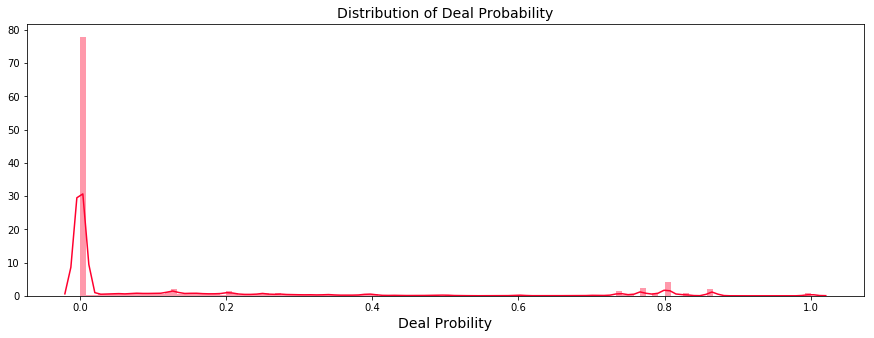

In [12]:
## 1. Deal Probability Distribution
plt.figure(figsize=(15,5))
sns.distplot(train_df["deal_probability"].values, bins=120, color="#ff002e")
plt.xlabel('Deal Probility', fontsize=14);
plt.title("Distribution of Deal Probability", fontsize=14);
plt.show();

0に近い数字が大部分を占めることがわかる

#### deal probability bins

In [22]:
def _generate_bar_plot_hor(df, col, title, color, w=None, h=None, lm=0, limit=100):
    cnt_srs = df[col].value_counts()[:limit]
    trace = go.Bar(y=cnt_srs.index[::-1], x=cnt_srs.values[::-1], orientation = 'h',
        marker=dict(color=color))

    layout = dict(title=title, margin=dict(l=lm), width=w, height=h)
    data = [trace]
    fig = go.Figure(data=data, layout=layout)
    py.iplot(fig)

def _generate_bar_plot_ver(df, col, title, color, w=None, h=None, lm=0, limit=100, need_trace = False):
    cnt_srs = df[col].value_counts()[:limit]
    trace = go.Bar(x=list(cnt_srs.index), y=list(cnt_srs.values),
        marker=dict(color = color))
    if need_trace:
        return trace
    if w != None and h != None:
        layout = dict(title=title, margin=dict(l=lm), width=w, height=h)
    else:
        layout = dict(title=title, margin=dict(l=lm))
    data = [trace]
    fig = go.Figure(data=data, layout=layout)
    py.iplot(fig)

trace1 = _generate_bar_plot_ver(train_df, 'deal_class_2', "Deal Probability Bins", '#7a8aa3', lm=0, limit=30, need_trace = True)
trace2 = _generate_bar_plot_ver(train_df, 'deal_class', "Deal Proabibilities (>0.5 or <= 0.5)", ['#f25771','#93ef51'], 200, limit=30, need_trace = True)

fig = tools.make_subplots(rows=1, cols=3, specs=[[{'colspan': 2}, {},{}]], print_grid=False, subplot_titles = ['Deal Probability Bins','','Deal Proabibilities (>0.5 or <= 0.5)'])
fig.append_trace(trace1, 1, 1);
fig.append_trace(trace2, 1, 3);

fig['layout'].update(height=400, title='',showlegend=False)
py.iplot(fig);

Deal Probabilityについて
- 0-0.2の値を大部分が占める
- 0.5以下が1.3Million, 0.5以上が182Kである

In [26]:
cols = ['parent_category_name_en', 'category_name_en', 'region_en', 'city', 'param_1', 'param_2', 'param_3', 'weekday', 'day','title_len', 'description_len', 'image_top_1', 'user_id']

#### Distribution of Parent Category

In [27]:
_generate_bar_plot_hor(train_df, cols[0], "Distribution of Parent Category", '#f2b5bc', 600, 400, 200)

#### distribution of Category

In [28]:
_generate_bar_plot_hor(train_df, cols[1], "Distribution of Category", '#66f992', 600, 500, 200, limit=30)

#### Which Region has highest number of items

In [29]:
_generate_bar_plot_hor(train_df, cols[2], "Distribution of Region", '#71c8e8', 600, 600, 200, limit=30)

Visualizing the Regions on the Map

<img src="https://i.imgur.com/vqyGHRW.png" width=600>

#### Distribution of Cities

In [30]:
_generate_bar_plot_hor(train_df, cols[3], "Distribution of City", '#c2e2a3', 600, 600, 200, limit=30)

#### Understanding distributions of Param_1 and Param_2 in the dataset

In [35]:
trace1 = _generate_bar_plot_ver(train_df, cols[4], "Param 1 Values", '#1bf7bc', 700, 400, 200, limit=30, need_trace = True)
trace2 = _generate_bar_plot_ver(train_df, cols[5], "Param 2 Values", '#1bf7bc', 700, 400, 200, limit=30, need_trace = True)
trace3 = _generate_bar_plot_ver(train_df, cols[6], "Param 3 Values", '#1bf7bc', 700, 400, 200, limit=30, need_trace = True)

fig = tools.make_subplots(rows=1, cols=3, print_grid=False, subplot_titles = ['Param 1 Values','Param 2 Values', 'Param 3 Values'])
fig.append_trace(trace1, 1, 1);
fig.append_trace(trace2, 1, 2);
fig.append_trace(trace3, 1, 3);

fig['layout'].update(height=400,title='Top Values in Param 1,2,3 columns', showlegend=False);
py.iplot(fig);

param1 371, param2 271, param3 1200個の値が存在，param3は長さなどかなり細かいカテゴリーを含んでいる．

#### 掲載された曜日と日にち

In [37]:
trace1 = _generate_bar_plot_ver(train_df, cols[7], "WeekDays", '#d38bed', 700, 400, 200, limit=30, need_trace = True)
trace2 = _generate_bar_plot_ver(train_df, cols[8], "MonthDays", '#d38bed', 700, 400, 200, limit=30, need_trace = True)


fig = tools.make_subplots(rows=1, cols=2, print_grid=False, subplot_titles = ['Week Days','Month Days'])
fig.append_trace(trace1, 1, 1);
fig.append_trace(trace2, 1, 2);

fig['layout'].update(height=300,title='Ads Posted in different Week/Month Days', showlegend=False);
py.iplot(fig); 

- 金曜日がもっとも少なく，土曜日が最も多い

#### タイトルと説明の単語数

In [38]:
trace1 = _generate_bar_plot_ver(train_df, cols[9], "Title Length", '#f7a92c', 700, 400, 200, limit=30, need_trace = True)
trace2 = _generate_bar_plot_ver(train_df, cols[10], "Description Length", '#f7a92c', 700, 400, 200, limit=30, need_trace = True)

fig = tools.make_subplots(rows=1, cols=2, print_grid=False, subplot_titles = ['Title Word Count','Description Word Count'])
fig.append_trace(trace1, 1, 1);
fig.append_trace(trace2, 1, 2);

fig['layout'].update(height=400, title='', showlegend=False);
py.iplot(fig);

#### Image Top1(画像の分類コード) and UserId

In [39]:
trace1 = _generate_bar_plot_ver(train_df, cols[11], "Image Top 1", '#e2dfd9', 700, 400, 200, limit=30, need_trace = True)
trace2 = _generate_bar_plot_ver(train_df, cols[12], "User Id", '#e2dfd9', 700, 400, 200, limit=30, need_trace = True)


fig = tools.make_subplots(rows=1, cols=2, print_grid=False, subplot_titles = ['Image Top 1','User Id'])
fig.append_trace(trace1, 1, 1);
fig.append_trace(trace2, 1, 2);

fig['layout'].update(height=400,title='Ads having different ImageTop1 and User Id', showlegend=False);
py.iplot(fig);

#### Distribution of User-Type in the dataset

In [40]:
def _create_pie_chart(df, col):
    tm = df[col].value_counts()
    labels = list(tm.index)
    values = list(tm.values)
    trace = go.Pie(labels=labels, values=values, marker=dict(colors=['#f9c968', '#75e575', '#d693b3']))
    return trace
trace1 = _create_pie_chart(train_df, 'user_type')
layout = go.Layout(title='Distribution of User Type', width=600, height=400, margin=dict(l=100))
data = [trace1]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

#### 広告の掲載期間

In [42]:
t = pr_train['total_period'].value_counts()

labels = list(t.index)
labels = [str(x).replace("00:00:00","").strip() for x in labels]
values = list(t.values)

layout = go.Layout(title='For How Much Days Ads are Run', width=600, height=400, margin=dict(l=100), xaxis=dict(tickangle=-65))
trace1 = go.Bar(x=labels, y=values, marker=dict(color="#FF7441"))

data = [trace1]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

広告の期間が短いと取引の確率も低い

#### Top Brands/Products present in Title

In [45]:
from wordcloud import WordCloud

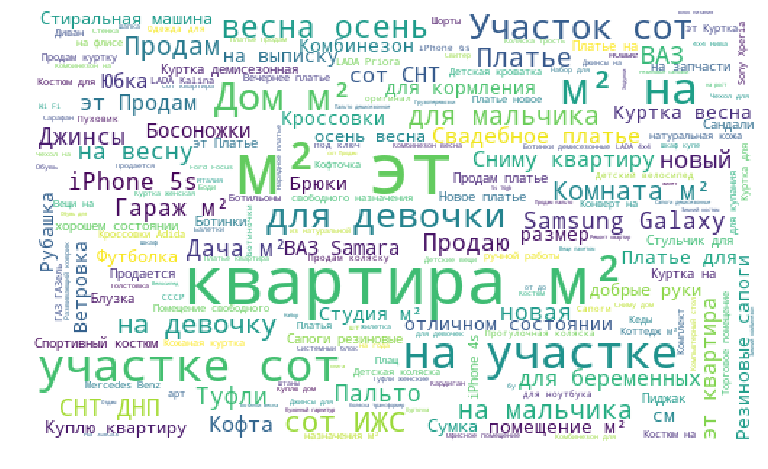

In [53]:
txt = " ".join(train_df.title)

wordcloud = WordCloud(background_color='white', max_font_size=50, width=500, height=300).generate(txt)
plt.figure(figsize=(16,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

## Multi-Variate Analysis
#### 変数全体

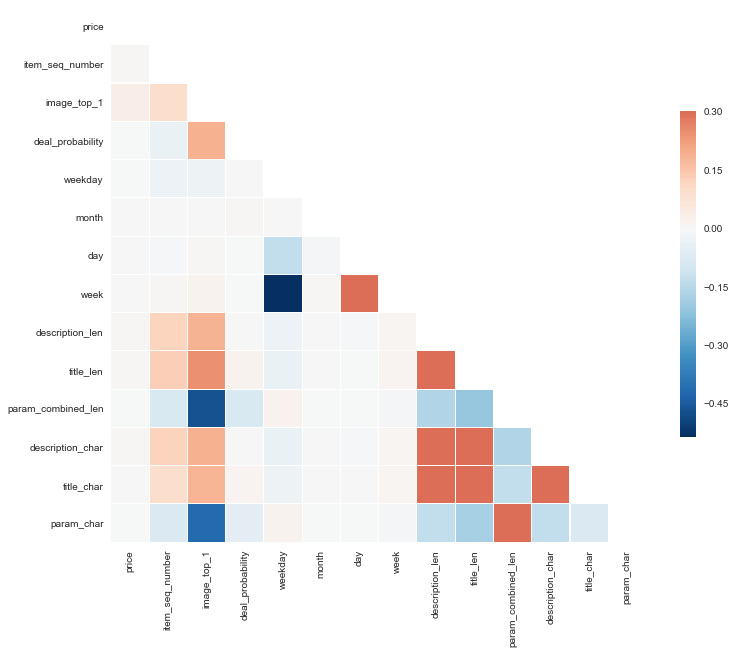

In [18]:
corr = train_df.corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.set(style="white")

f, ax = plt.subplots(figsize=(12, 12))
sns.heatmap(corr, mask=mask, cmap="RdBu_r", vmax=.3, center=0, square=True, linewidths=.1, cbar_kws={"shrink": .5})

取引する確率と相関があるのは，image_top_1, param_combined_len(パラメータの語数), param_char(パラメータの文字数)

#### 親カテゴリーとユーザ別の取引の確率

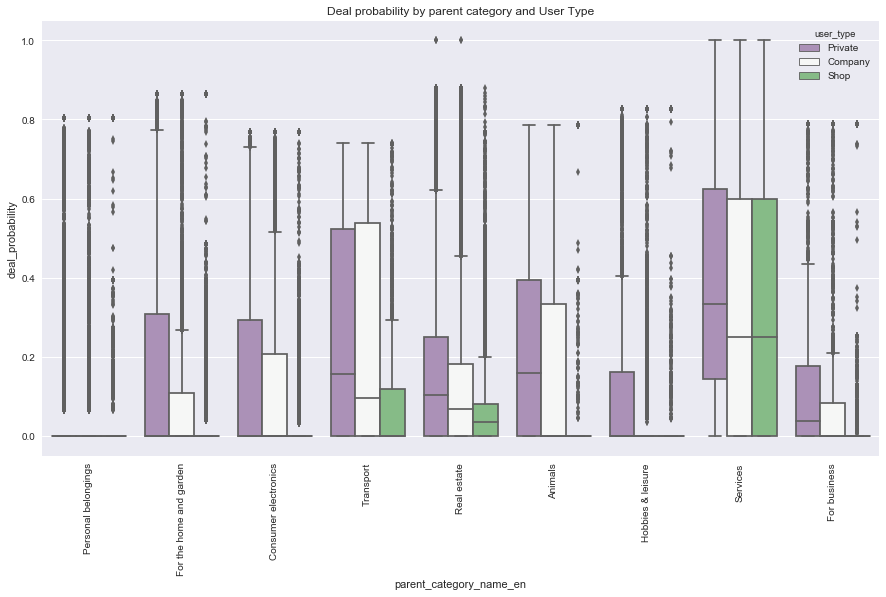

In [24]:
sns.set(rc={'figure.figsize':(15, 8)})
sns.boxplot(x="parent_category_name_en", y="deal_probability", hue="user_type",  palette="PRGn", data=train_df)
plt.title("Deal probability by parent category and User Type")
plt.xticks(rotation='vertical')
plt.show()

#### 地域とユーザー別の取引確率

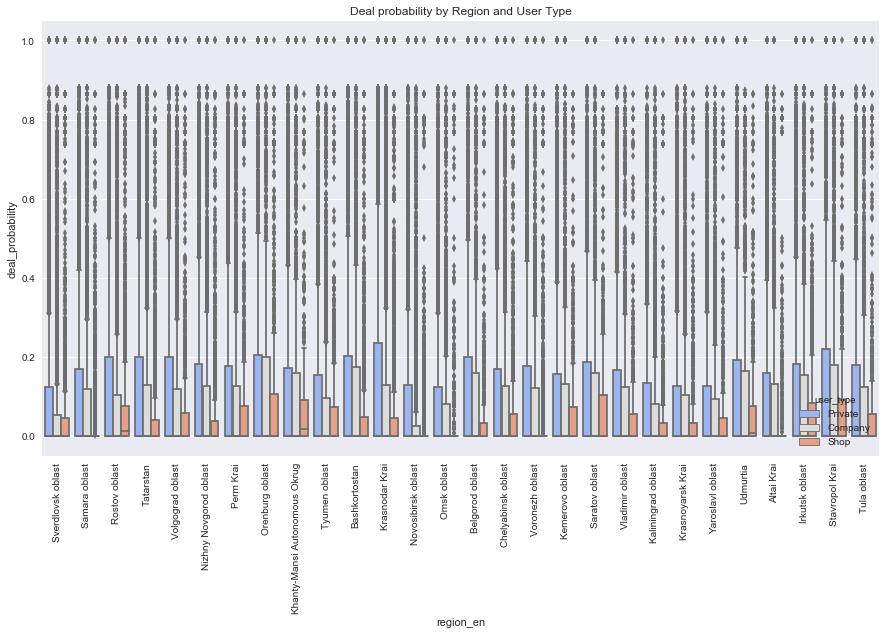

In [29]:
sns.set(rc={'figure.figsize':(15,8)})
sns.boxplot(x="region_en", y="deal_probability", hue="user_type",  palette="coolwarm", data=train_df)
plt.title("Deal probability by Region and User Type")
plt.xticks(rotation='vertical')
plt.show()

#### 値段の対数と取引の確率

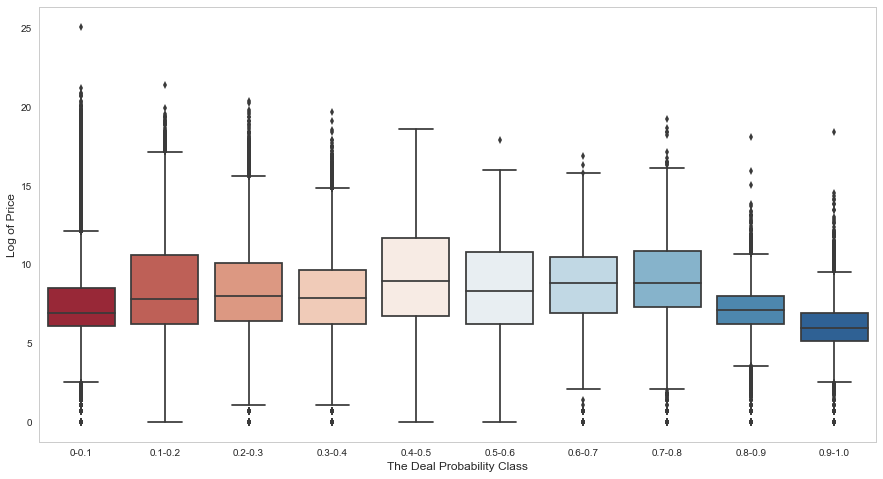

In [30]:
train_df['price_log'] = np.log(train_df['price'] + 1)
sns.set_style("whitegrid", {'axes.grid' : False})
g = sns.boxplot(x='deal_class_2', y='price_log', data=train_df, palette="RdBu")
g.set_xlabel('The Deal Probability Class',fontsize=12)
g.set_ylabel('Log of Price',fontsize=12)
plt.show()

#### 親カテゴリと取引確率別にどれくらいアイテムがあるか

In [32]:
cols = ['parent_category_name_en','deal_class_2']
colmap = sns.light_palette("#ff4284", as_cmap=True)
pd.crosstab(train_df[cols[0]], train_df[cols[1]]).style.background_gradient(cmap = colmap)

deal_class_2,0-0.1,0.1-0.2,0.2-0.3,0.3-0.4,0.4-0.5,0.5-0.6,0.6-0.7,0.7-0.8,0.8-0.9,0.9-1.0
parent_category_name_en,,,,,,,,,,
Animals,5269,25379,876,194,4511,134,0,9067,7040,0
Consumer electronics,13321,111770,1653,585,9931,442,0,27625,7681,0
For business,1870,13325,115,53,1078,120,0,1395,119,0
For the home and garden,13115,118028,1790,446,9330,216,26267,568,9063,0
Hobbies & leisure,5436,64808,660,193,3626,143,9034,243,1868,0
Personal belongings,41554,579607,1357,1073,21169,554,47412,787,4110,0
Real estate,26407,89557,4165,1793,15823,2095,1009,6258,6078,5
Services,11190,15235,4531,408,5434,4347,300,5277,7592,10071
Transport,7982,37052,4779,837,5907,1077,0,17726,4479,0


#### 地域と取引確率別のアイテム数

In [33]:
cols = ['region_en','deal_class_2']
colmap = sns.light_palette("#7cc8ff", as_cmap=True)
pd.crosstab(train_df[cols[0]], train_df[cols[1]]).style.background_gradient(cmap = colmap)

deal_class_2,0-0.1,0.1-0.2,0.2-0.3,0.3-0.4,0.4-0.5,0.5-0.6,0.6-0.7,0.7-0.8,0.8-0.9,0.9-1.0
region_en,,,,,,,,,,
Altai Krai,3720,29045,400,140,2249,187,2724,1501,1386,168
Bashkortostan,6350,45528,1208,258,4309,537,3225,3595,2715,566
Belgorod oblast,2414,19820,467,115,1543,214,1428,1456,1139,272
Chelyabinsk oblast,6411,55044,1002,302,3691,394,4983,3891,2228,393
Irkutsk oblast,4244,30078,565,170,2731,260,2511,1708,1485,278
Kaliningrad oblast,2362,24045,285,104,1318,147,2380,1204,770,141
Kemerovo oblast,3884,31443,458,152,2296,214,2787,1821,1420,160
Khanty-Mansi Autonomous Okrug,2647,19640,399,127,1671,175,1633,1254,957,206
Krasnodar Krai,13627,95227,2434,571,8146,1228,5969,7205,5540,1469


#### 地域，取引確率別に平均価格を表示

In [35]:
def _create_bubble_plots(col1, col2, aggcol, func, title, cs):
    tempdf = train_df.groupby([col1, col2]).agg({aggcol : func}).reset_index()
    tempdf[aggcol] = tempdf[aggcol].apply(lambda x : int(x))
    tempdf = tempdf.sort_values(aggcol, ascending=False)

    sizes = list(reversed([i for i in range(10,31)]))
    intervals = int(len(tempdf) / len(sizes))
    size_array = [9]*len(tempdf)
    
    st = 0
    for i, size in enumerate(sizes):
        for j in range(st, st+intervals):
            size_array[j] = size 
        st = st+intervals
    tempdf['size_n'] = size_array
    # tempdf = tempdf.sample(frac=1).reset_index(drop=True)

    cols = list(tempdf['size_n'])

    trace1 = go.Scatter( x=tempdf[col1], y=tempdf[col2], mode='markers', text=tempdf[aggcol],
        marker=dict( size=tempdf.size_n, color=cols, colorscale=cs ))
    data = [trace1]
    layout = go.Layout(title=title)
    fig = go.Figure(data=data, layout=layout)
    py.iplot(fig)

_create_bubble_plots('region_en', 'deal_class_2', 'price', 'mean', '', 'Picnic')

#### 親カテゴリと取引確率別の平均価格

In [46]:
# _create_bubble_plots('parent_category_name_en', 'deal_class_2', 'price', 'mean', '', 'Electric')

#### 取引確率と曜日別の平均価格

In [47]:
# _create_bubble_plots('deal_class_2', 'weekday_en', 'price', 'mean', '', 'Jet')

#### 曜日，地域別の平均価格

In [48]:
# _create_bubble_plots('region_en', 'weekday_en', 'price', 'mean', 'Mean Price of Items by Regions and Deal Probability Class', 'Portland')

#### 曜日，地域別の最大価格

In [49]:
# _create_bubble_plots('region_en', 'weekday_en', 'price', 'max', '', 'Hot')

#### 地域，曜日別の最大取引値

In [50]:
# _create_bubble_plots('parent_category_name_en', 'weekday_en', 'deal_probability', 'max', '', 'Earth')

## 価格の特徴

#### 曜日，日別の平均価格

In [51]:
def _aggregate(base_col, agg_col, agg_func, return_trace = False):
    tempdf = train_df.groupby(base_col).agg({agg_col : agg_func})
    
    trace = go.Bar(x=tempdf.index, y=tempdf.price, name='', marker=dict(color='#8a7aff'))
    if return_trace:
        return trace
    
    data = [trace]
    layout = go.Layout(title='', width=500, legend=dict(orientation="h"), margin=dict(b=200))
    fig = go.Figure(data=data, layout=layout)
    py.iplot(fig)
# trace1 = _aggregate('weekday', 'price', 'mean', return_trace=True)
# trace2 = _aggregate('day', 'price', 'mean', return_trace=True)

# fig = tls.make_subplots(rows=1, cols=2, print_grid=False, subplot_titles = ['Mean Price on WeekDays','Mean Price of Month Days'])
# fig.append_trace(trace1, 1, 1);
# fig.append_trace(trace2, 1, 2);

# fig['layout'].update(height=400, paper_bgcolor='#f0eff7', plot_bgcolor='#f0eff7', showlegend=False);
# py.iplot(fig);

#### 地域，都市別の平均価格

In [ ]:
# trace1 = _aggregate('category_name_en', 'price', 'mean', return_trace=True)
# trace2 = _aggregate('parent_category_name_en', 'price', 'mean', return_trace=True)

# fig = tools.make_subplots(rows=1, cols=2, print_grid=False, subplot_titles = ['Mean Price on Categories','Mean Price of Parent Categories'])
# fig.append_trace(trace1, 1, 1);
# fig.append_trace(trace2, 1, 2);

# fig['layout'].update(height=400, paper_bgcolor='#f0eff7', plot_bgcolor='#f0eff7', showlegend=False);
# iplot(fig); 

#### カテゴリー別の平均価格

In [54]:
trace1 = _aggregate('category_name_en', 'price', 'mean', return_trace=True)
trace2 = _aggregate('parent_category_name_en', 'price', 'mean', return_trace=True)

fig = tls.make_subplots(rows=1, cols=2, print_grid=False, subplot_titles = ['Mean Price on Categories','Mean Price of Parent Categories'])
fig.append_trace(trace1, 1, 1);
fig.append_trace(trace2, 1, 2);

fig['layout'].update(height=400, paper_bgcolor='#f0eff7', plot_bgcolor='#f0eff7', showlegend=False);
py.iplot(fig);

#### タイトル，説明別の平均価格

In [56]:
trace1 = _aggregate('title_len', 'price', 'mean', return_trace=True)
trace2 = _aggregate('description_len', 'price', 'mean', return_trace=True)

fig = tls.make_subplots(rows=1, cols=2, print_grid=False, subplot_titles = ['Mean Price by Title Length','Mean Price by Description Length'])
fig.append_trace(trace1, 1, 1);
fig.append_trace(trace2, 1, 2);

fig['layout'].update(height=400, paper_bgcolor='#f0eff7', plot_bgcolor='#f0eff7', showlegend=False);
py.iplot(fig);

## 取引確率が高い商品の特徴

In [58]:
good_performing_ads = train_df[train_df['deal_probability'] >= 0.90]
bad_performing_ads = train_df[train_df['deal_probability'] <= 0.05]

#### 使用されている言葉

#### 特徴を比較

In [59]:
def get_trace(col, df, color):
    temp = df[col].value_counts().nlargest(3)
    x = list(reversed(list(temp.index)))
    y = list(reversed(list(temp.values)))
    trace = go.Bar(x = y, y = x, width = [0.9, 0.9, 0.9], orientation='h', marker=dict(color=color))
    return trace

compare_cols = ['parent_category_name_en', 'category_name', 'city', 'param_1', 'param_2', 'weekday', 'title_len', 'description_len']

goodtraces = []
goodtitles = []
for i,col in enumerate(compare_cols):
    goodtitles.append(col)
    goodtraces.append(get_trace(col, good_performing_ads, '#a3dd56'))

badtraces = []
badtitles = []
for i,col in enumerate(compare_cols):
    badtitles.append(col)
    badtraces.append(get_trace(col, bad_performing_ads, '#ef7067'))

titles = []
for each in compare_cols:
    titles.append(each)
    titles.append(each)
fig = tls.make_subplots(rows=len(compare_cols), cols=2, print_grid=False, horizontal_spacing = 0.15, subplot_titles=titles)
i = 0
for g,b in zip(goodtraces, badtraces):
    i += 1
    fig.append_trace(g, i, 1);
    fig.append_trace(b, i, 2);

fig['layout'].update(height=1000, margin=dict(l=100), showlegend=False, title="Comapring Features of Ads with High and Low Deal Percentages");
py.iplot(fig, filename='simple-subplot');

#### Top N-gramを使用

## 良い画像と悪い画像
取引の確率が高いと良い画像で，低いと悪い画像

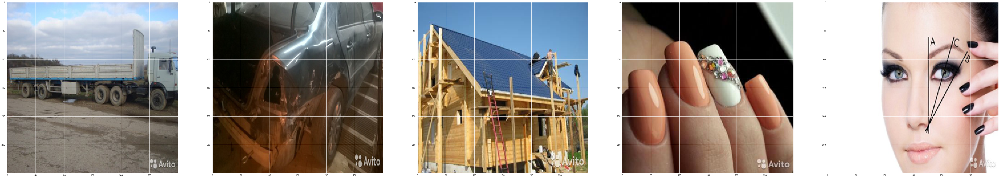

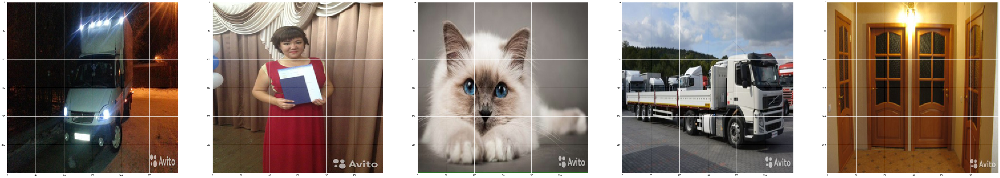

In [28]:
import zipfile
from PIL import Image 
import numpy as np 
from IPython.display import display, HTML

good_images = train_df[train_df['deal_probability'] == 1]['image'][:10]
good_images = good_images.dropna()

bad_images = train_df[train_df['deal_probability'] == 0.0]['image'][:10]
bad_images = bad_images.dropna()

goodones = []
badones = []
with zipfile.ZipFile('/Users/tela/.kaggle/competitions/avito-demand-prediction/train_jpg.zip', 'r') as train_zip:
    files_in_zip = sorted(train_zip.namelist())
    for idx, file in enumerate(files_in_zip):
        if any(file.endswith(x+".jpg") for x in good_images): 
            img = train_zip.extract(file, path=file.split('/')[3])
            goodones.append(img)
        elif any(file.endswith(x+".jpg") for x in bad_images): 
            img = train_zip.extract(file, path=file.split('/')[3])
            badones.append(img)

f, ax = plt.subplots(1,5)
f.set_size_inches(80, 40)
for i in range(5):
    ax[i].imshow(Image.open(goodones[i]).resize((300, 300), Image.ANTIALIAS))
plt.show()

f, ax = plt.subplots(1,5)
f.set_size_inches(80, 40)
for i in range(5):
    ax[i].imshow(Image.open(goodones[i+5]).resize((300, 300), Image.ANTIALIAS))
plt.show()

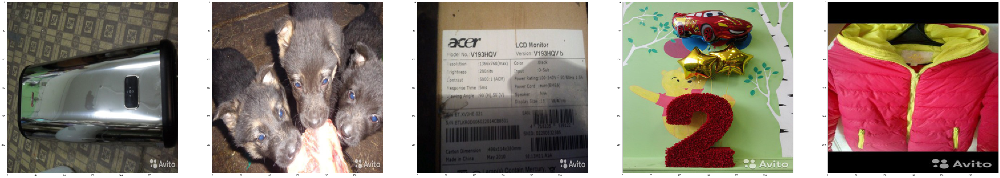

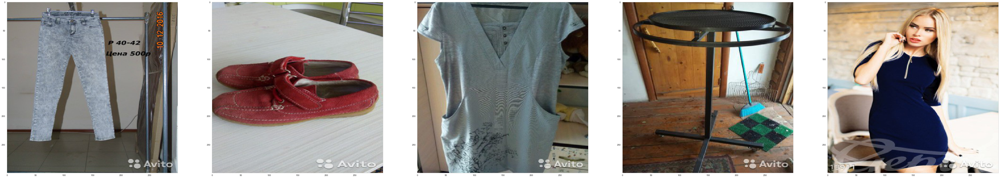

In [31]:
f, ax = plt.subplots(1,5)
f.set_size_inches(80, 40)
for i in range(5):
    ax[i].imshow(Image.open(badones[i]).resize((300, 300), Image.ANTIALIAS))
plt.show()

f, ax = plt.subplots(1,5)
f.set_size_inches(80, 40)
for i in range(5):
    ax[i].imshow(Image.open(badones[i+5]).resize((300, 300), Image.ANTIALIAS))
plt.show()